# bigTACO downloader

- bigTACO = official TACO + unofficial TACO

- **If you run into issues at codes related to gdrive, please check that you have access to trashAI's shared gdrive folder and that it's added as a shortcut in your "MyDrive" root folder.**


In [ ]:
# install image dependency. 
# Run this cell and do a manual restart

import os
if os.path.isfile('./toggle.txt'):
  print('Pillow in place, pass')
  pass
else:
  !pip install --upgrade Pillow
  !touch toggle.txt
  exit(0)

Pillow in place, pass


In [ ]:
# mount gdrive
# to save a copy of bigTACO in the shared folder, please add the shared TrashAI folder as a shortcut to your own google drive. 

from google.colab import drive

drive.mount('/gdrive',force_remount = True)

Mounted at /gdrive


In [ ]:
%%capture
# get annotation files for TACO
!wget https://raw.githubusercontent.com/pedropro/TACO/master/data/annotations_unofficial.json
!wget https://github.com/pedropro/TACO/raw/master/data/annotations.json

In [ ]:
import os
import argparse
import json
import requests
from io import BytesIO
import sys
import re
from tqdm import tqdm

from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from tqdm import tqdm

import shutil
import os
import copy

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils


In [ ]:
%rm -rf bigTACO
%mkdir bigTACO

In [ ]:
o = './annotations.json'
uo = './annotations_unofficial.json'
data_dir = './bigTACO'

In [ ]:
def anno_reader(anno_path):
  with open(anno_path, 'r') as f:
    annotations = json.loads(f.read())
    nr_images = len(annotations['images'])
    images = annotations['images']
  return nr_images, images

In [ ]:
# print number of images
nr_o,nr_uo=anno_reader(o)[0],anno_reader(uo)[0]

print('there are '+ str(nr_o)+' unofficial TACO images')
print('\nthere are '+ str(nr_uo)+' unofficial TACO images')

there are 1500 unofficial TACO images

there are 3831 unofficial TACO images


In [ ]:
# combine official and unofficial image list
images=anno_reader(o)[1]+anno_reader(uo)[1]

In [ ]:
# original author stipulates all images to be saved in .jpg. Check:
for i in [re.search("[^.]+$", j).group() for j in [i['file_name'] for i in images]]:
  if i.upper() != 'JPG':
    print('NOT JPG')

In [ ]:
for i in tqdm(range(len(images))):
  # download images
  image = images[i]

  img_id = str(i)+'.jpg'
  url_original = image['flickr_url']

  file_path = os.path.join(data_dir, img_id)

  if not os.path.isfile(file_path):
    # Load and Save Image
    response = requests.get(url_original)
    img = Image.open(BytesIO(response.content))
    rgb_im = img.convert('RGB')
    
    if img._getexif():
      rgb_im.save(file_path, exif=img.info["exif"])
    else:
      rgb_im.save(file_path)

100%|██████████| 5331/5331 [1:05:46<00:00,  1.35it/s]


In [ ]:
nr_imgs=None
for _,_,k in os.walk('./bigTACO'):
  print('total number of bigTACO images:')
  nr_imgs = len(k)
  print(len(k))

total number of bigTACO images:
5331


In [ ]:
%mkdir ./bigTACO/{images,labels} && cd ./bigTACO && mv *.jpg ./images && cd ..

In [ ]:
base_anno = './annotations.json'
unof_anno =  './annotations_unofficial.json'

base_coco_anno = COCO(annotation_file=base_anno)
unof_coco_anno = COCO(annotation_file=unof_anno)

with open(base_anno, 'r') as f:
    base_anno = json.loads(f.read())

with open(unof_anno, 'r') as f:
    unof_anno = json.loads(f.read())   


loading annotations into memory...
Done (t=0.13s)
creating index...
index created!
loading annotations into memory...
Done (t=0.16s)
creating index...
index created!


In [ ]:
import copy
!mkdir /content/bigTACO/labels_seg

dst = "./bigTACO"
base_imgs = base_anno['images']
unof_imgs = unof_anno['images']

counter=0
for img in tqdm(base_imgs+unof_imgs):
  height = img['height']
  width = img['width']

  # reorganize annotations
  img_id_ = img['id']

  if counter<1500: 
    annotation_ids = base_coco_anno.getAnnIds(img_id_)
    # reorganize images
  else: 
    annotation_ids = unof_coco_anno.getAnnIds(img_id_)

  # if len(annotation_ids) == 0:
  #   continue
  with open(dst+'/labels/'+str(counter)+'.txt', mode='w') as fp:
    # get bbox labels
    if counter<1500: annotations = base_coco_anno.loadAnns(annotation_ids)
    else: annotations = unof_coco_anno.loadAnns(annotation_ids)
    
    lines = ''
    for annotation in annotations:
      if len(annotation['segmentation'])==0: continue
      else:
        class_ = copy.copy(annotation['category_id'])
        box = copy.copy(annotation['bbox'])

        # top_x,top_y,width,height ----> cen_x,cen_y,width,height
        # standardize to 0-1
        box[0] = round((box[0] + box[2] / 2) / width, 6)
        box[1] = round((box[1] + box[3] / 2) / height, 6)
        box[2] = round(box[2] / width, 6)
        box[3] = round(box[3] / height, 6)
        # line: super_id x_center y_center width height
        lines = lines + str(class_)
        for i in box:
            lines += ' ' + str(i)
        lines += '\n'
    fp.writelines(lines)

  with open(dst+'/labels_seg/'+str(counter)+'.txt', mode='w') as fp:
    # get segmentation labels
    if counter<1500: annotations = base_coco_anno.loadAnns(annotation_ids)
    else: annotations = unof_coco_anno.loadAnns(annotation_ids)
    lines = ''
    for annotation in annotations:
      if len(annotation['segmentation'])==0: continue
      else:
        class_ = copy.copy(annotation['category_id'])
        box = copy.copy(annotation['bbox'])
        seg = copy.copy(annotation['segmentation'])[0]

        segmentation = []
        for id,x in enumerate(seg):
          # standardize to 0-1
          if id%2 ==0: x/=width
          else: x/=height
          segmentation.append(x)

        lines += str(class_)
        for i in segmentation:
          lines += ' ' + str(i)
        lines = lines+ '\n'
    fp.writelines(lines)

  counter+=1

100%|██████████| 5331/5331 [00:02<00:00, 2094.98it/s]


In [ ]:
# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
  if ExifTags.TAGS[orientation] == 'Orientation':
    break

In [ ]:
def orientation_reder(image_filepath,size=False):
  # Load image
  I = Image.open(image_filepath)

  h,w = I.size
  a= 1
  # Load and process image metadata
  if I._getexif():
      exif = I._getexif()
      try: 
        a = exif[orientation]
        if a ==0:
          a=1
      except: pass
  if size==True:
    return a, h, w
  else: return a

ori_list=[]
for i in range(len(base_imgs+unof_imgs)):
  ori_list.append([i,orientation_reder('./bigTACO/images/'+str(i)+'.jpg')])

In [ ]:
def img_box_visualizer(id):
  image_filepath = './bigTACO/images/'+str(id)+'.jpg'
  label_filepath = './bigTACO/labels/'+str(id)+'.txt'
  pylab.rcParams['figure.figsize'] = (28,28)
  ####################

  # Load image
  print(image_filepath)
  I = Image.open(image_filepath)
  # Show image
  fig,ax = plt.subplots(1)
  plt.axis('off')
  plt.imshow(I)

  # Load mask ids
  annotations = pd.read_csv(label_filepath,header=None,delimiter=' ')
  W,H = I.size
  # Show annotations
  for _,row in annotations.iterrows():
    [x, y, w, h] = row.tolist()[1:]
    x=round((x-w/2)*W)
    y=round((y-h/2)*H)
    w=round(w*W)
    h=round(h*H)
    rect = Rectangle((x,y),w,h,linewidth=4,edgecolor='red',facecolor='none', alpha=0.7, linestyle = '--')
    ax.add_patch(rect)
  plt.show()

./bigTACO/images/2947.jpg


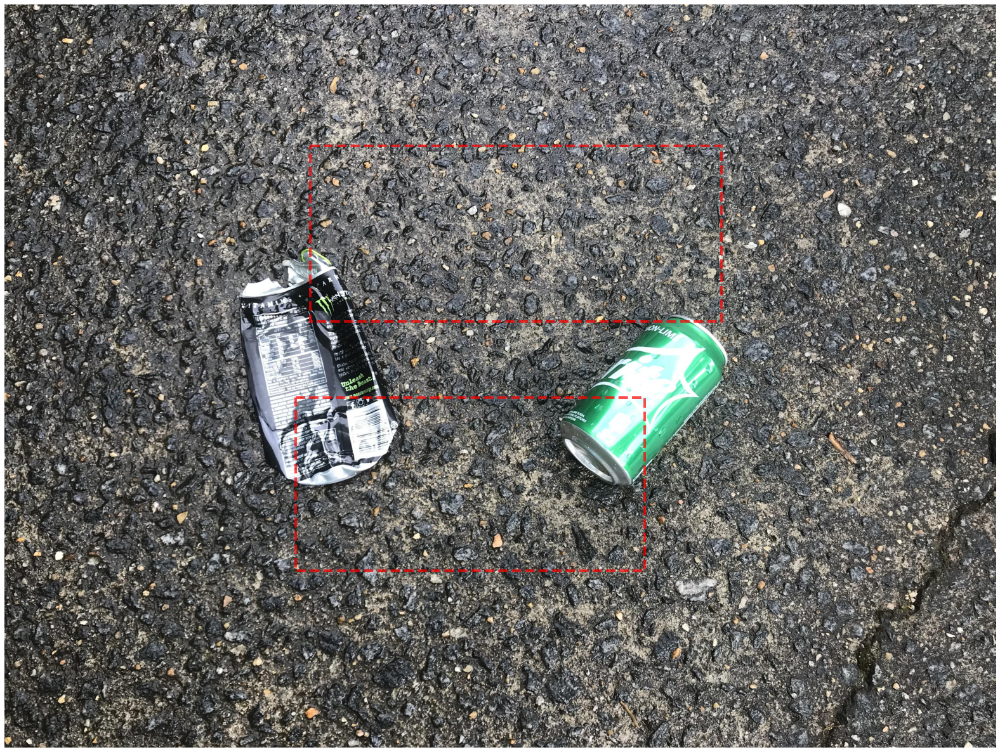

In [ ]:
# Some pictures' EXIF orientation is not 1 and that may be a problem because not all training models rotate automatically
# See an example below -- bounding boxes are wrongly layered
id = 2947   
img_box_visualizer(id)


In [ ]:
# third party exif remover tool
!wget https://raw.githubusercontent.com/john-science/exif_delete/master/exif_delete.py

from exif_delete import *

--2023-03-20 06:21:06--  https://raw.githubusercontent.com/john-science/exif_delete/master/exif_delete.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3432 (3.4K) [text/plain]
Saving to: ‘exif_delete.py’

exif_delete.py      100%[===================>]   3.35K  --.-KB/s    in 0.001s  

2023-03-20 06:21:07 (6.19 MB/s) - ‘exif_delete.py’ saved [3432/3432]



In [ ]:
# Rotate pictures and save a clean copy
for id,orientation_ in tqdm([i for i in ori_list if i[1]!=1]):
  image_filepath = 'bigTACO/images/'+str(id)+'.jpg'
  ####################
  if orientation_!=1:
    # Load image
    exif_delete(image_filepath, image_filepath)

100%|██████████| 770/770 [37:23<00:00,  2.91s/it]


In [ ]:
# after exif removing, check if there are orientation that's NOT 1
set([orientation_reder('bigTACO/images/'+str(i)+'.jpg') for i in range(1500)]) != {1}

False

./bigTACO/images/2947.jpg


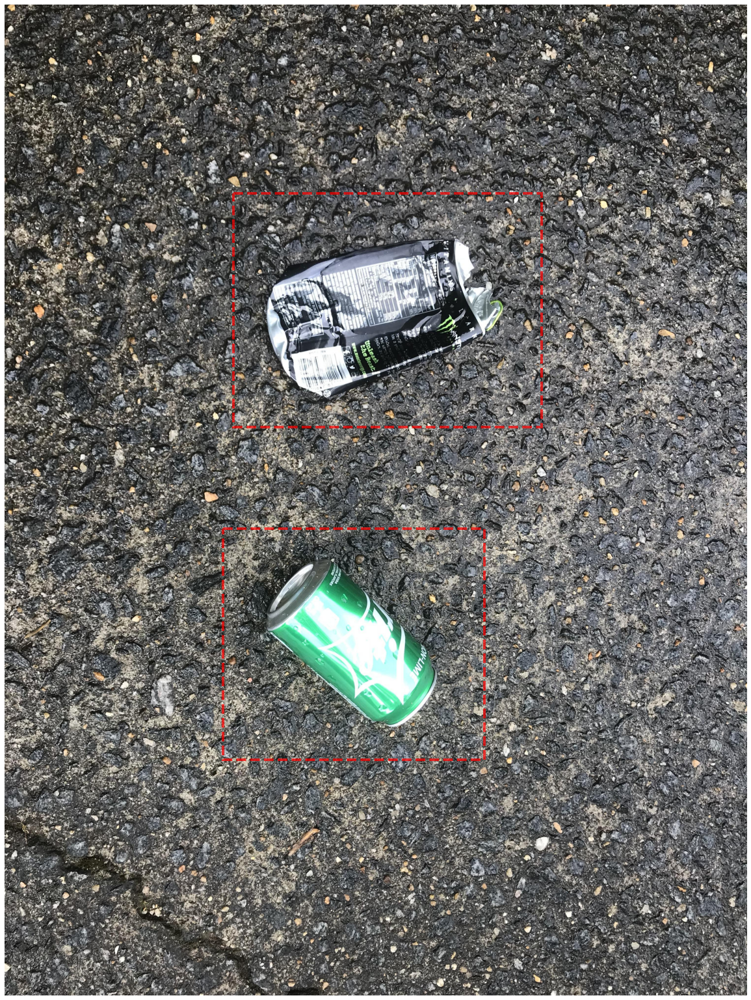

In [ ]:
# Visualize again picture, see if correct now
id = 2947   
img_box_visualizer(id)

In [ ]:
# Save processed images and label to google drive

!zip -qq -r ./bigTACO_processed.zip ./bigTACO/*
!cp ./bigTACO_processed.zip '/gdrive/MyDrive/Trash AI/Data/'

In [ ]:
from google.colab import runtime
runtime.unassign()